###   BUSINESS CASE 3 <img align='LEFT' width='100' height='100' src='https://maiseducativa.com/wp-content/uploads/2015/02/Logo_Nova-IMS.jpg'>
<font color='SlateBlue'>__Business Cases with Data Science__</font><br> 
 Group F - May of 2024
<p> 

 Document written by: 
<p>
 
 __Ricardo Kayseller - 20230450__ <p>
 __Stepan Kuznetsov - 20231002__ <p>
 __Bernardo Pinto - 20230978__ <p>
 __Nicolas Reyes - 20230779__ <p>
 __Emília Santos - 20230446__ <p>


## Introduction

Recheio is embarking on a comprehensive digital transformation initiative centered on deploying an advanced recommendation system to expand its customer base and drive sales. By leveraging extensive data analysis across client, product, and transaction datasets, the project aims to develop a system that not only understands customer preferences but also predicts future buying patterns effectively. Through strategic market analysis and internal data capabilities, Recheio seeks to provide relevant, actionable recommendations, enhancing customer relevancy and transaction volumes. This initiative is poised to bolster Recheio's competitive edge by delivering precise, customer-focused marketing strategies, ultimately strengthening its position as a market leader and supporting sustained business growth in a highly competitive landscape.

# Initial setup and modules/packages loading

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Load the code

Load the Excel file given by Recheio, with 4 sheets.

In [2]:
df = pd.read_excel(r"C:\Users\emili\Downloads\Case 3\Recommender Systems-20240415\Case3_Recheio_v2.xlsx", sheet_name=['1. CLIENTS', '2. PRODUCTS', '3. TRANSACTIONS','4. CLIENT TYPES'])
df

{'1. CLIENTS':      Unnamed: 0 Unnamed: 1 Unnamed: 2      Unnamed: 3
 0           NaN  Client ID   ZIP Code  ID Client Type
 1           NaN         63       2645             217
 2           NaN        226       2765             201
 3           NaN        228       1350             206
 4           NaN        282       1250             201
 ..          ...        ...        ...             ...
 926         NaN       8892       2750             214
 927         NaN       8901       2780             201
 928         NaN       8902       2780             227
 929         NaN       8908       2845             219
 930         NaN       8912       1495             214
 
 [931 rows x 4 columns],
 '2. PRODUCTS':       Unnamed: 0  Unnamed: 1                     Unnamed: 2  \
 0            NaN  ID Product            Product Description   
 1            NaN      110110   ACUCAR MCHEF BRANCO PAPEL KG   
 2            NaN      110211       AÇÚCAR SIDUL AMARELO 1KG   
 3            NaN      11040

# Data Understanding/Exploration

The group received a CSV file from Recheio, composed by 4 sheets, relative to information about clients, products, transactions and client types. For each sheet (Client, Products, Transactions and Client Types) given on the Recheio Excel file, an exploration of the data was done below:

### Clients

In [3]:
df_clients = df['1. CLIENTS']
df_clients

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3
0,NaN,Client ID,ZIP Code,ID Client Type
1,NaN,63,2645,217
2,NaN,226,2765,201
3,NaN,228,1350,206
4,NaN,282,1250,201
...,...,...,...,...
926,NaN,8892,2750,214
927,NaN,8901,2780,201
928,NaN,8902,2780,227
929,NaN,8908,2845,219


In [4]:
df_clients = df_clients.drop(columns='Unnamed: 0')

In [5]:
df_clients = df_clients.rename(columns={'Unnamed: 1': 'Client ID', 'Unnamed: 2': 'ZIP Code', 'Unnamed: 3': 'ID Client Type'})

In [6]:
df_clients.drop(0, inplace=True)

In [7]:
df_clients.set_index('Client ID', inplace = True)

In [8]:
df_clients

,ZIP Code,ID Client Type
Client ID,,
63,2645,217
226,2765,201
228,1350,206
282,1250,201
357,1250,210
...,...,...
8892,2750,214
8901,2780,201
8902,2780,227


In [9]:
df_clients

,ZIP Code,ID Client Type
Client ID,,
63,2645,217
226,2765,201
228,1350,206
282,1250,201
357,1250,210
...,...,...
8892,2750,214
8901,2780,201
8902,2780,227


#### Missing Values

In [10]:
df_clients.isnull().sum()

ZIP Code          0
ID Client Type    0
dtype: int64

In [11]:
df_clients.info()

<class 'pandas.core.frame.DataFrame'>
Index: 930 entries, 63 to 8912
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   ZIP Code        930 non-null    object
 1   ID Client Type  930 non-null    object
dtypes: object(2)
memory usage: 21.8+ KB


- There are **no missing values** on "Clients" dataframe.

#### Data Desciption

In [12]:
df_clients.describe()

,ZIP Code,ID Client Type
count,930,930
unique,116,28
top,1100,201
freq,53,220


Describe method shows:
- "ZIP Code" has 930 non-null observations with 116 unique values
- the most frequent ZIP code is 1100, occurring 53 times
- "ID Client Type" has also 930 non-null observations with 28 unique values
- the most frequent ID is 201, occurring 220 times

#### Duplicates

In [13]:
# Check duplicate values
df_clients.duplicated().sum()

419

In [14]:
#Example that shows some duplicates (checked using also the Excel file itslef)

# Filter rows where the ZIP Code is 1600
zip_1600_rows = df_clients[df_clients['ZIP Code'] == 1600]

# Display the filtered rows
print(zip_1600_rows)

          ZIP Code ID Client Type
Client ID                        
1959          1600            224
1961          1600            224
2819          1600            221
3053          1600            204
3737          1600            214
4555          1600            202
4893          1600            214
5130          1600            224
6200          1600            211
6351          1600            203
7713          1600            209
7869          1600            210
8022          1600            202
8056          1600            214
8188          1600            201
8214          1600            201
8227          1600            201
8593          1600            227
8641          1600            201
8695          1600            219
8743          1600            201
8753          1600            227
8766          1600            206
8777          1600            217
8881          1600            209


For different Client ID's, there are rows with the same ZIP Code and then the same ID Client Type. 
- In the same ZIP Code, there is more than 1 client that has the same type of establishment. For example, there might be 2 italian restaurants in ZIP Code 1600.

### Products

In [15]:
df_products = df['2. PRODUCTS']
df_products

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3
0,NaN,ID Product,Product Description,ID Product Category
1,NaN,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS
2,NaN,110211,AÇÚCAR SIDUL AMARELO 1KG,BENS ESSENCIAIS
3,NaN,110401,OLEO ALIMENTAR MCHEF 1 LT,BENS ESSENCIAIS
4,NaN,110406,OLEO FULA ALIMENTAR 1 LT,BENS ESSENCIAIS
...,...,...,...,...
2494,NaN,750107,V.DOURO SAGRADO TTO 75CL,VINHO
2495,NaN,750111,V.DOURO SAGRADO RES. TTO 75CL,VINHO
2496,NaN,750202,VINHO MESA FORTIS BCO 250ML,VINHO
2497,NaN,750406,V. DOURO SAGRADO VT TTO 75CL,VINHO


In [16]:
df_products = df_products.rename(columns={'Unnamed: 1': 'ID Product', 'Unnamed: 2': 'Product Description', 'Unnamed: 3': 'ID Product Category'})

In [17]:
df_products = df_products.drop(columns='Unnamed: 0')

In [18]:
df_products.drop(0, inplace=True)

In [19]:
df_products.set_index('ID Product', inplace = True)

In [20]:
df_products

,Product Description,ID Product Category
ID Product,,
110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS
110211,AÇÚCAR SIDUL AMARELO 1KG,BENS ESSENCIAIS
110401,OLEO ALIMENTAR MCHEF 1 LT,BENS ESSENCIAIS
110406,OLEO FULA ALIMENTAR 1 LT,BENS ESSENCIAIS
110408,ÓLEO VAQUEIRO ALIMENTAR 1 LT,BENS ESSENCIAIS
...,...,...
750107,V.DOURO SAGRADO TTO 75CL,VINHO
750111,V.DOURO SAGRADO RES. TTO 75CL,VINHO
750202,VINHO MESA FORTIS BCO 250ML,VINHO


#### Missing Values

In [21]:
df_products.isnull().sum()

Product Description    0
ID Product Category    0
dtype: int64

In [22]:
df_products.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2498 entries, 110110 to 888819
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Product Description  2498 non-null   object
 1   ID Product Category  2498 non-null   object
dtypes: object(2)
memory usage: 58.5+ KB


- There are **no missing values** on "Products" dataframe.

#### Data Desciption

In [23]:
df_products.describe()

,Product Description,ID Product Category
count,2498,2498
unique,2497,33
top,QJ BRIE MG 60% CUNHA PRESIDENT 200G,ALIMENTACAO CORRENTE
freq,2,538


Describe method shows:
- There are 2498 non-null observations for both "Product Description" and "ID Product Category"
- "Product Description" has 2497 unique values, meaning there might be one duplicate product description
- The most frequently occurring product description is "QJ BRIE MG 60% CUNHA PRESIDENT 200G", which occurs twice
- "ID Product Category" has 33 unique categories
- The most frequent product category is "ALIMENTACAO CORRENTE", occuring 538 times

#### Duplicates

In [24]:
# Check duplicate values
df_products.duplicated().sum()

1

In [25]:
df_products[df_products.duplicated(subset=['Product Description'], keep=False)]

,Product Description,ID Product Category
ID Product,,
263811,QJ BRIE MG 60% CUNHA PRESIDENT 200G,QUEIJOS
263829,QJ BRIE MG 60% CUNHA PRESIDENT 200G,QUEIJOS


Remove the duplicated row, since both show the same information:

In [26]:
df_products = df_products.drop_duplicates()
df_products

,Product Description,ID Product Category
ID Product,,
110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS
110211,AÇÚCAR SIDUL AMARELO 1KG,BENS ESSENCIAIS
110401,OLEO ALIMENTAR MCHEF 1 LT,BENS ESSENCIAIS
110406,OLEO FULA ALIMENTAR 1 LT,BENS ESSENCIAIS
110408,ÓLEO VAQUEIRO ALIMENTAR 1 LT,BENS ESSENCIAIS
...,...,...
750107,V.DOURO SAGRADO TTO 75CL,VINHO
750111,V.DOURO SAGRADO RES. TTO 75CL,VINHO
750202,VINHO MESA FORTIS BCO 250ML,VINHO


### Transactions

In [27]:
df_transactions = df['3. TRANSACTIONS']
df_transactions 

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3
0,NaN,Date,Client ID,ID Product
1,NaN,2019-03-01 00:00:00,4442,291708
2,NaN,2019-03-01 00:00:00,4442,291726
3,NaN,2019-03-01 00:00:00,4442,291756
4,NaN,2019-03-01 00:00:00,4442,293029
...,...,...,...,...
234220,NaN,2019-05-31 00:00:00,4063,511546
234221,NaN,2019-05-31 00:00:00,4063,511940
234222,NaN,2019-05-31 00:00:00,4063,512316
234223,NaN,2019-05-31 00:00:00,4063,531112


Data given was referent to transactions between March 1st and May 31th, from 2019.

In [28]:
df_transactions  = df_transactions.rename(columns={'Unnamed: 1': 'Date', 'Unnamed: 2': 'Client ID', 'Unnamed: 3': 'ID Product'})

In [29]:
df_transactions = df_transactions.drop(columns='Unnamed: 0')

In [30]:
df_transactions.drop(0, inplace=True)

In [31]:
df_transactions.set_index('Date', inplace = True)

In [32]:
df_transactions

,Client ID,ID Product
Date,,
2019-03-01,4442,291708
2019-03-01,4442,291726
2019-03-01,4442,291756
2019-03-01,4442,293029
2019-03-01,4442,293330
...,...,...
2019-05-31,4063,511546
2019-05-31,4063,511940
2019-05-31,4063,512316


#### Missing Values

In [33]:
df_transactions.isnull().sum()

Client ID     0
ID Product    0
dtype: int64

In [34]:
df_transactions.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 234224 entries, 2019-03-01 to 2019-05-31
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Client ID   234224 non-null  object
 1   ID Product  234224 non-null  object
dtypes: object(2)
memory usage: 5.4+ MB


- There are **no missing values** on "Transactions" dataframe.

#### Data Desciption

In [35]:
df_transactions.describe()

,Client ID,ID Product
count,234224,234224
unique,930,2498
top,4426,110110
freq,2112,3379


Describe method shows:
- "Client ID": There are 234224 non-null observations and 930 unique client IDs
- The most frequent client ID is 4426, occurring 2112 times
- "ID Product": There are also 234224 non-null observations and 2498 unique product IDs
- The most frequent product ID is 110110, occurring 3379 times

#### Duplicates

In [36]:
# Check duplicate values
df_transactions.duplicated().sum()

185842

In [37]:
#Example that shows some duplicates (checked using also the Excel file itslef)

# Filter rows where the Client ID is 4442 and Product ID is 291708
filtered_rows = df_transactions[(df_transactions['Client ID'] == 4442) & (df_transactions['ID Product'] == 291708)]

# Display the filtered rows
print(filtered_rows)

           Client ID ID Product
Date                           
2019-03-01      4442     291708
2019-03-05      4442     291708
2019-03-08      4442     291708
2019-03-15      4442     291708
2019-03-19      4442     291708
2019-03-22      4442     291708
2019-03-29      4442     291708
2019-04-05      4442     291708
2019-04-09      4442     291708
2019-04-12      4442     291708
2019-04-16      4442     291708
2019-04-19      4442     291708
2019-04-26      4442     291708
2019-04-30      4442     291708
2019-05-03      4442     291708
2019-05-07      4442     291708
2019-05-10      4442     291708
2019-05-17      4442     291708
2019-05-24      4442     291708


- Client ID's can repeat itself, each one corresponding to different transactions, i.e., one client bought the same product on different dates
- Therefore, there is no need to deal with this duplicates, since they have a meaning

### Client Types

In [38]:
df_client_types = df['4. CLIENT TYPES']
df_client_types 

,Unnamed: 0,Unnamed: 1,Unnamed: 2
0,NaN,ID Client Type,Cliente Type Description
1,NaN,201,COZINHA PORTUGUESA
2,NaN,202,COZINHA ITALIANA
3,NaN,203,COZINHA CHINESA
4,NaN,204,COZINHA INDIANA
5,NaN,205,CERVEJARIA
6,NaN,206,CHURRASQUEIRA
7,NaN,207,COZINHA VEGETARIANA
8,NaN,208,COZINHA AUTOR
9,NaN,209,HAMBURGUERIAS


In [39]:
df_client_types  = df_client_types.rename(columns={'Unnamed: 1': 'ID Client Type', 'Unnamed: 2': 'Client Type Description'})

In [40]:
df_client_types = df_client_types.drop(columns='Unnamed: 0')

In [41]:
df_client_types.drop(0, inplace=True)

In [42]:
df_client_types

,ID Client Type,Client Type Description
1,201,COZINHA PORTUGUESA
2,202,COZINHA ITALIANA
3,203,COZINHA CHINESA
4,204,COZINHA INDIANA
5,205,CERVEJARIA
6,206,CHURRASQUEIRA
7,207,COZINHA VEGETARIANA
8,208,COZINHA AUTOR
9,209,HAMBURGUERIAS
10,210,HOTEIS 4/5 ESTRELAS


#### Missing Values

In [43]:
df_client_types.isnull().sum()

ID Client Type             0
Client Type Description    0
dtype: int64

In [44]:
df_client_types.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28 entries, 1 to 28
Data columns (total 2 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   ID Client Type           28 non-null     object
 1   Client Type Description  28 non-null     object
dtypes: object(2)
memory usage: 580.0+ bytes


- There are **no missing values** on df_client_types.

#### Data Desciption

In [45]:
df_client_types.describe()

,ID Client Type,Client Type Description
count,28,28
unique,28,28
top,201,COZINHA PORTUGUESA
freq,1,1


Describe method shows:
-  There are 28 unique descriptions
-  All client types appear just once, just have one description

#### Duplicates

In [46]:
# Check duplicate values
df_client_types.duplicated().sum()

0

- There are no duplicates.

## Merge df_clients, df_products, df_transactions and df_client_types

Merge dataframes to improve visualizations and produce better insights, having the information all together.

In [47]:
#reset index in order to have the Client ID in the merged dataframe
df_clients = df_clients.reset_index()
df_clients

,Client ID,ZIP Code,ID Client Type
0,63,2645,217
1,226,2765,201
2,228,1350,206
3,282,1250,201
4,357,1250,210
...,...,...,...
925,8892,2750,214
926,8901,2780,201
927,8902,2780,227
928,8908,2845,219


In [48]:
#reset index in order to have the date in the merged dataframe
df_transactions = df_transactions.reset_index()
df_transactions

,Date,Client ID,ID Product
0,2019-03-01,4442,291708
1,2019-03-01,4442,291726
2,2019-03-01,4442,291756
3,2019-03-01,4442,293029
4,2019-03-01,4442,293330
...,...,...,...
234219,2019-05-31,4063,511546
234220,2019-05-31,4063,511940
234221,2019-05-31,4063,512316
234222,2019-05-31,4063,531112


In [49]:
# Merge based on 'ID Product' - df_products and df_transactions
prod_transactions = pd.merge(df_products, df_transactions, on='ID Product', how='left')

# Display the merged DataFrame
prod_transactions

,ID Product,Product Description,ID Product Category,Date,Client ID
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,8490
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,8206
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,3575
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,6850
...,...,...,...,...,...
234140,750202,VINHO MESA FORTIS BCO 250ML,VINHO,2019-05-06,6454
234141,750202,VINHO MESA FORTIS BCO 250ML,VINHO,2019-05-20,6647
234142,750406,V. DOURO SAGRADO VT TTO 75CL,VINHO,2019-04-11,7664
234143,888819,RAPPEL ANUAL,ENTREGAS AO DOMICILIO,2019-03-04,4037


#### Dataframe resulting from the merge of df_clients, df_products, df_transactions

In [50]:
# Merge based on 'Client ID' - prod_transactions and df_clients
client_transactions = pd.merge(prod_transactions, df_clients, on='Client ID')

# Display the merged DataFrame
client_transactions

,ID Product,Product Description,ID Product Category,Date,Client ID,ZIP Code,ID Client Type
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,2820,219
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,2820,219
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,2820,219
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,2820,219
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,2820,219
...,...,...,...,...,...,...,...
234140,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,1250,201
234141,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,1250,201
234142,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,1400,201
234143,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-27,7364,1400,201


#### Dataframe resulting from the merge of df_clients, df_products, df_transactions and df_client_types

In [51]:
print(df_client_types['ID Client Type'].unique())
print(client_transactions['ID Client Type'].unique())

[201 202 203 204 205 206 207 208 209 210 211 213 214 215 216 217 219 220
 221 222 224 226 227 228 229 233 235 236]
['219' '214' '203' '211' '210' '201' '220' '217' '202' '206' '204' '208'
 '209' '221' '226' '227' '222' '228' '215' '207' '216' '224' '205' '229'
 '213' '235' '233' '236']


- "ID Client Type" column in df_client_types contains integer values, while in client_transactions, it contains string values

In [52]:
# Convert the "ID Client Type" column in client_transactions to integers
client_transactions['ID Client Type'] = client_transactions['ID Client Type'].astype(int)

# check unique values again to ensure consistency
print(df_client_types['ID Client Type'].unique())
print(client_transactions['ID Client Type'].unique())

[201 202 203 204 205 206 207 208 209 210 211 213 214 215 216 217 219 220
 221 222 224 226 227 228 229 233 235 236]
[219 214 203 211 210 201 220 217 202 206 204 208 209 221 226 227 222 228
 215 207 216 224 205 229 213 235 233 236]


In [53]:
# Merge based on 'ID Client Type' 
client_transactions = pd.merge(client_transactions,df_client_types, on='ID Client Type', how='left')

# Display the merged DataFrame
client_transactions

,ID Product,Product Description,ID Product Category,Date,Client ID,ZIP Code,ID Client Type,Client Type Description
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,2820,219,RODÍZIO CARNE
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,2820,219,RODÍZIO CARNE
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,2820,219,RODÍZIO CARNE
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,2820,219,RODÍZIO CARNE
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,2820,219,RODÍZIO CARNE
...,...,...,...,...,...,...,...,...
234140,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,1250,201,COZINHA PORTUGUESA
234141,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,1250,201,COZINHA PORTUGUESA
234142,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,1400,201,COZINHA PORTUGUESA
234143,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-27,7364,1400,201,COZINHA PORTUGUESA


In [54]:
client_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 234145 entries, 0 to 234144
Data columns (total 8 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   ID Product               234145 non-null  object        
 1   Product Description      234145 non-null  object        
 2   ID Product Category      234145 non-null  object        
 3   Date                     234145 non-null  datetime64[ns]
 4   Client ID                234145 non-null  object        
 5   ZIP Code                 234145 non-null  object        
 6   ID Client Type           234145 non-null  object        
 7   Client Type Description  234145 non-null  object        
dtypes: datetime64[ns](1), object(7)
memory usage: 14.3+ MB


## Check the day of the week for each date

Add two new features: 'Day of Week' and 'Weekday Name', to explore transations by day of the week, for instance.

In [55]:
# Get the day of the week for each date (0=Monday, 1=Tuesday, ..., 6=Sunday)
client_transactions['Day of Week'] = client_transactions['Date'].dt.dayofweek

# Map day of week to actual names
day_names = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
client_transactions['Weekday Name'] = client_transactions['Day of Week'].map(day_names)

# Display the updated DataFrame
client_transactions

,ID Product,Product Description,ID Product Category,Date,Client ID,ZIP Code,ID Client Type,Client Type Description,Day of Week,Weekday Name
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,2820,219,RODÍZIO CARNE,4,Friday
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,2820,219,RODÍZIO CARNE,2,Wednesday
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,2820,219,RODÍZIO CARNE,4,Friday
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,2820,219,RODÍZIO CARNE,4,Friday
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,2820,219,RODÍZIO CARNE,2,Wednesday
...,...,...,...,...,...,...,...,...,...,...
234140,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,1250,201,COZINHA PORTUGUESA,2,Wednesday
234141,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,1250,201,COZINHA PORTUGUESA,2,Wednesday
234142,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,1400,201,COZINHA PORTUGUESA,1,Tuesday
234143,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-27,7364,1400,201,COZINHA PORTUGUESA,2,Wednesday


In [56]:
client_transactions['Weekday Name'].unique()

array(['Friday', 'Wednesday', 'Saturday', 'Thursday', 'Monday', 'Tuesday'],
      dtype=object)

## Visualizations

#### Ten most and ten least frequent Product Categories

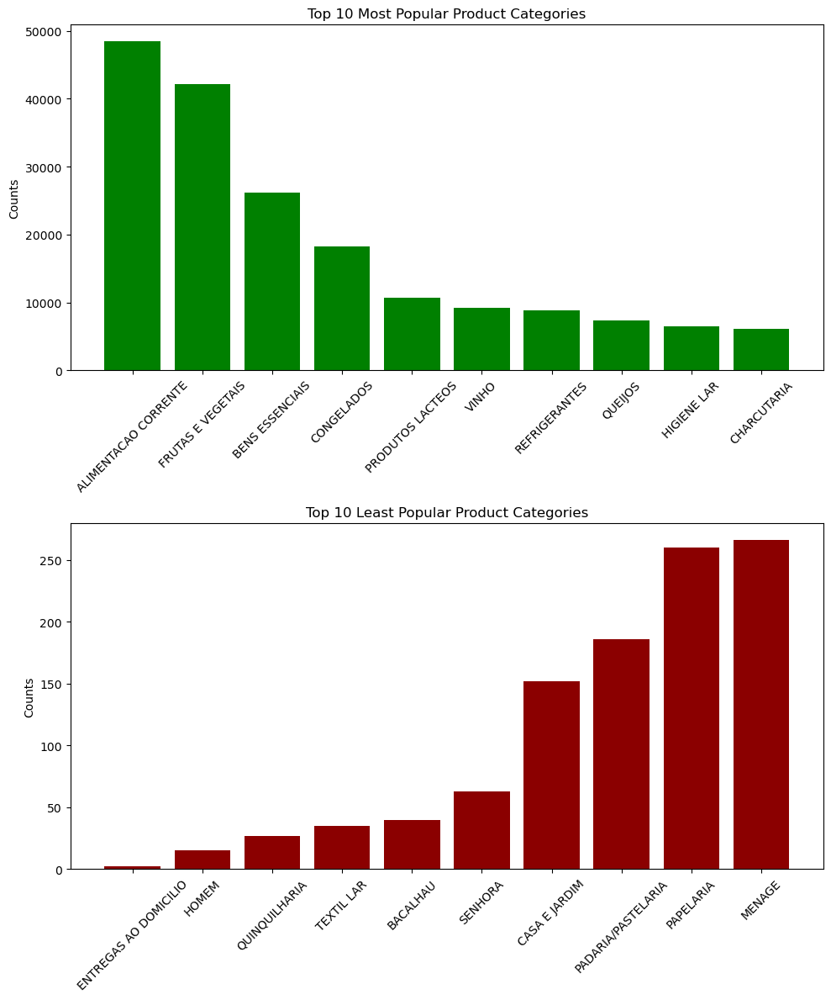

In [57]:
# Group by 'Product Description' and count occurrences
products_counts = client_transactions.groupby('ID Product Category').size().reset_index(name='counts')

# Get the top 10 most frequent items
top_10_products = products_counts.nlargest(10, 'counts')
# Get the 10 least frequent items
least_10_products = products_counts.nsmallest(10, 'counts')

# Create figure and subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# Plot for top 10 most frequent products
axs[0].bar(top_10_products['ID Product Category'], top_10_products['counts'], color='green')
axs[0].set_ylabel('Counts')
axs[0].set_title('Top 10 Most Popular Product Categories')
axs[0].tick_params(axis='x', rotation=45)

# Plot for 10 least frequent products
axs[1].bar(least_10_products['ID Product Category'], least_10_products['counts'], color='darkred')
axs[1].set_ylabel('Counts')
axs[1].set_title('Top 10 Least Popular Product Categories')
axs[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Looking at the graph, the 5 most sold categories are ‘ALIMENTAÇAO CORRENTE’, ‘FRUTAS E VEGETAIS’, ‘BENS ESSENCIAIS’, ‘CONGELADOS’ e ‘PRODUTOS LACTEOS’, while the least sold are ‘ENTREGAS AO DOMICILIO’, ‘HOMEM’, ‘QUINQUILHARIA’, ‘TEXTIL LAR’ and ‘BACALHAU’.

#### Total sales by product categories in each day of the week

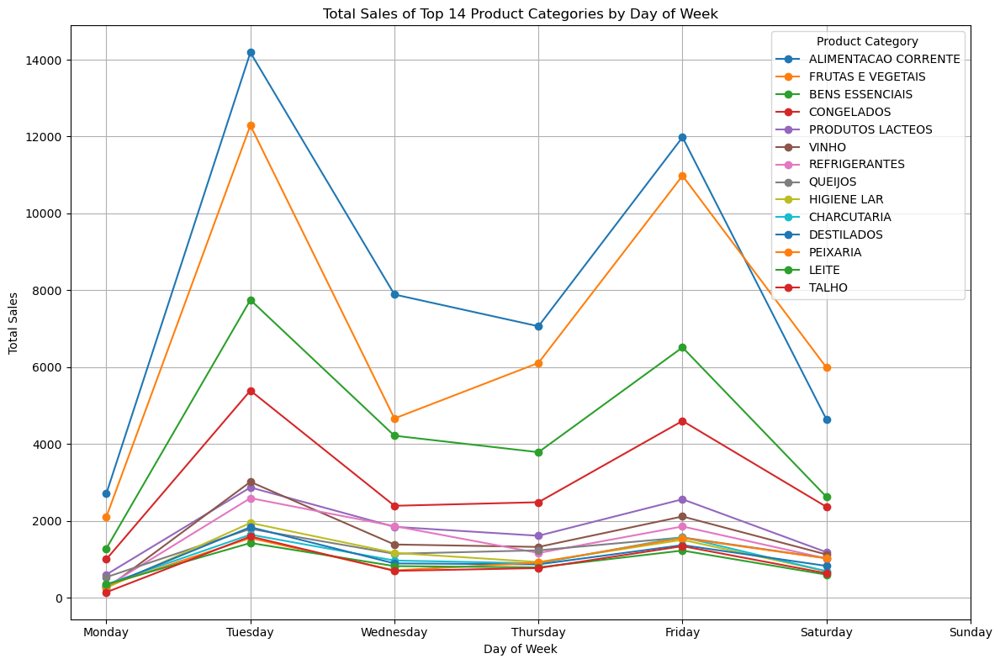

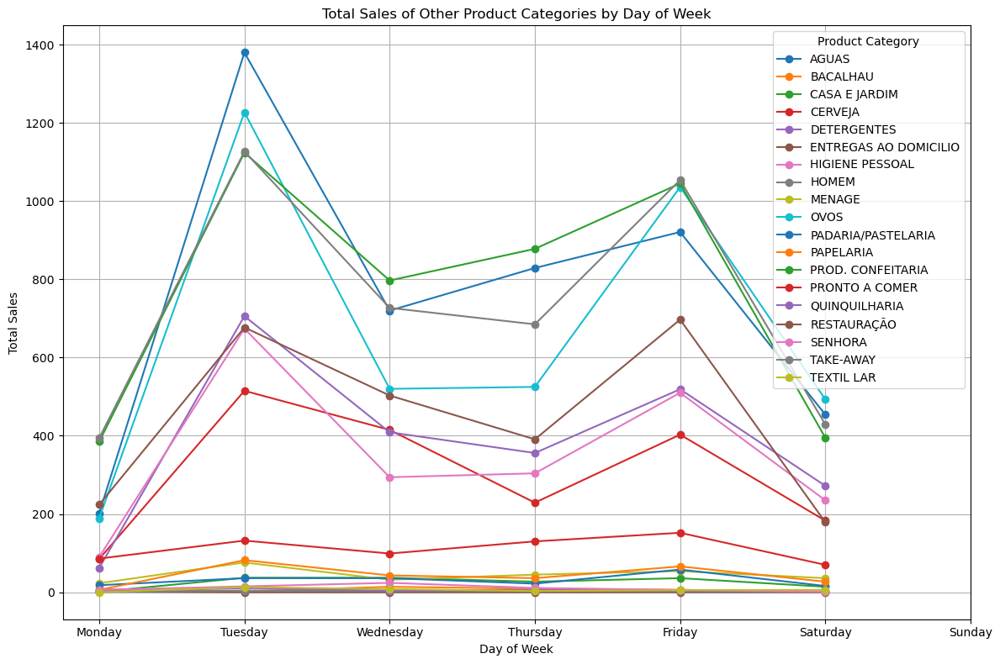

In [58]:
# Group by 'Product Description' and 'Day of Week' to count sales
sales_by_product_day = client_transactions.groupby(['ID Product Category', client_transactions['Date'].dt.dayofweek]).size().unstack(fill_value=0)

# Split into two groups: top 14 and the rest
top_14_products = sales_by_product_day.sum(axis=1).nlargest(14).index
other_products = sales_by_product_day.sum(axis=1).index.difference(top_14_products)

# Plot top 14 products on one graph
plt.figure(figsize=(12, 8))
for product in top_14_products:
    product_data = sales_by_product_day.loc[product]
    plt.plot(product_data.index, product_data.values, marker='o', label=product)

plt.xlabel('Day of Week')
plt.ylabel('Total Sales')
plt.title('Total Sales of Top 14 Product Categories by Day of Week')
plt.xticks(range(7), ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.legend(title='Product Category')
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot rest of the products on another graph
plt.figure(figsize=(12, 8))
for product in other_products:
    product_data = sales_by_product_day.loc[product]
    plt.plot(product_data.index, product_data.values, marker='o', label=product)

plt.xlabel('Day of Week')
plt.ylabel('Total Sales')
plt.title('Total Sales of Other Product Categories by Day of Week')
plt.xticks(range(7), ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.legend(title='Product Category')
plt.grid(True)
plt.tight_layout()
plt.show()

The transactions of the product categories are mostly done on Tuesday and Friday. The day where the least transactions are made is Monday, considering that on Sunday there are no sales.

#### Ten most and ten least frequent products

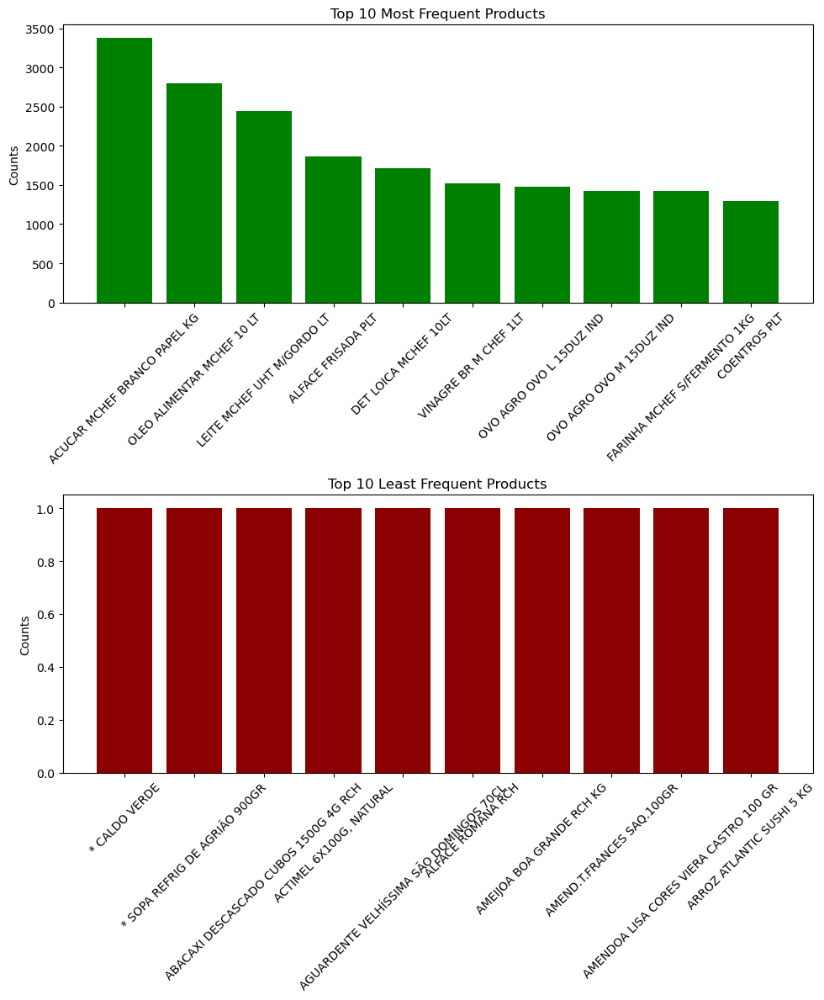

In [59]:
# Group by 'Product Description' and count occurrences
products_counts = client_transactions.groupby('Product Description').size().reset_index(name='counts')

# Get the top 10 most frequent items
top_10_products = products_counts.nlargest(10, 'counts')
# Get the 10 least frequent items
least_10_products = products_counts.nsmallest(10, 'counts')

# Create figure and subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# Plot for top 10 most frequent products
axs[0].bar(top_10_products['Product Description'], top_10_products['counts'], color='green')
axs[0].set_ylabel('Counts')
axs[0].set_title('Top 10 Most Frequent Products')
axs[0].tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability

# Plot for 10 least frequent products
axs[1].bar(least_10_products['Product Description'], least_10_products['counts'], color='darkred')
axs[1].set_ylabel('Counts')
axs[1].set_title('Top 10 Least Frequent Products')
axs[1].tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability

plt.tight_layout()
plt.show()

The 5 most frequent products are ‘ACUCAR MCHEF BRANCO PAPEL KG’, ‘OLEO ALIMENTAR MCHEF 10 LT’, ‘LEITE MCHEF UHT M/GORDO LT’, ‘ALFACE FRISADA PLT’ and ‘DET LOICA MCHEF 10LT’.

#### Top 10 most sold products by day of the week

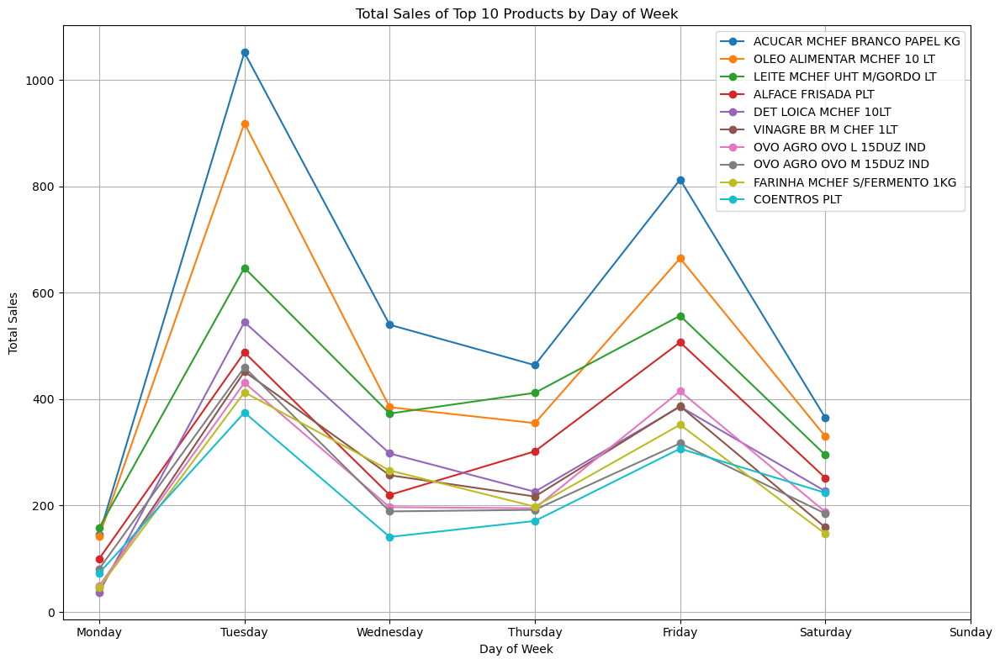

In [60]:
# Group by 'Product Description' and count sales
product_sales = client_transactions.groupby('Product Description').size().reset_index(name='Total Sales')

# Get the top 10 most sold products
top_10_products = product_sales.nlargest(10, 'Total Sales')['Product Description']

# Filter the DataFrame for the top 10 products
df_top_10 = client_transactions[client_transactions['Product Description'].isin(top_10_products)]

# Group by 'Product Description' and 'Day of Week' to count sales
sales_by_product_day = df_top_10.groupby(['Product Description', df_top_10['Date'].dt.dayofweek]).size().unstack(fill_value=0)

# Plot all products on the same graph
plt.figure(figsize=(12, 8))
for product in top_10_products:
    product_data = sales_by_product_day.loc[product]
    plt.plot(product_data.index, product_data.values, marker='o', label=product)

plt.xlabel('Day of Week')
plt.ylabel('Total Sales')
plt.title('Total Sales of Top 10 Products by Day of Week')
plt.xticks(range(7), ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

The transactions of the products that sell the most are mostly done on Tuesday and Friday. The day where the least transactions are made is Monday, considering that on Sunday there are no sales.

#### Ten most sold products by Product Category

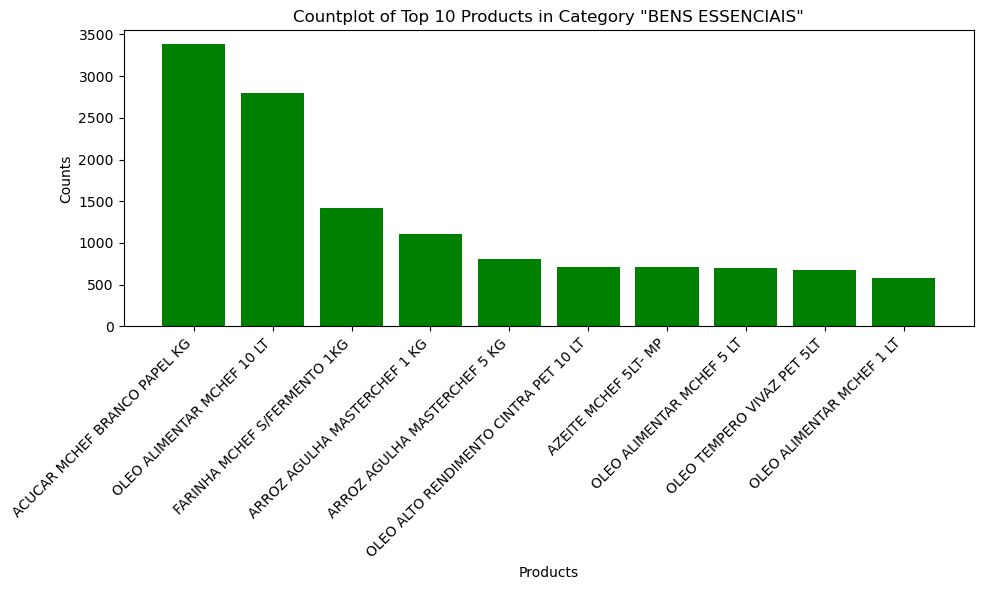

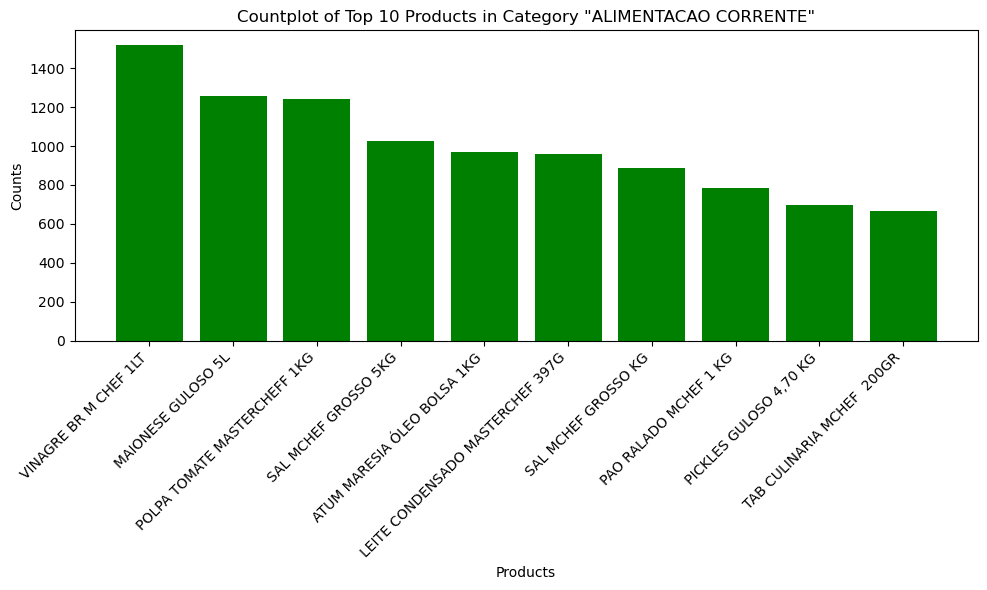

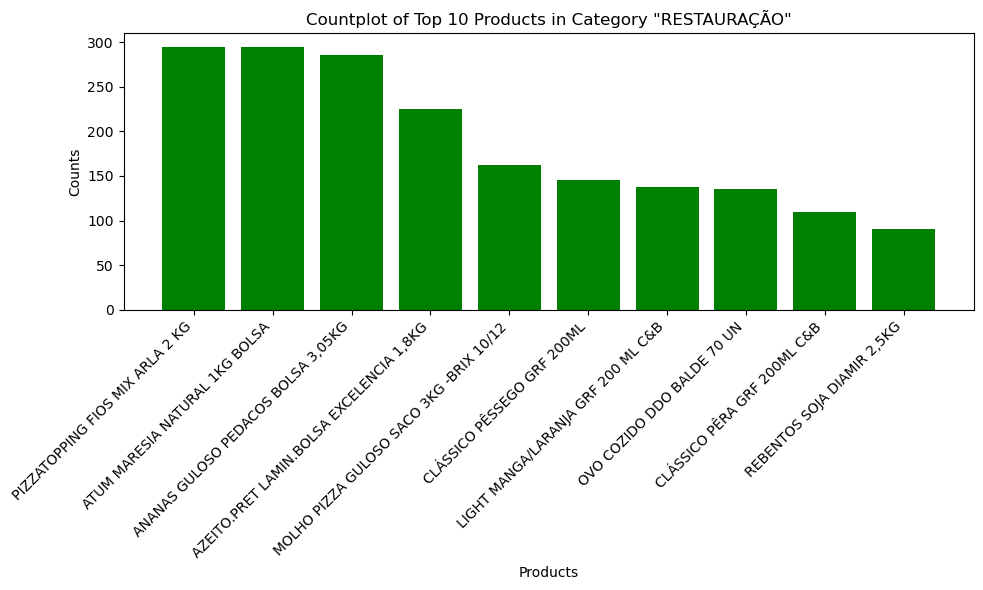

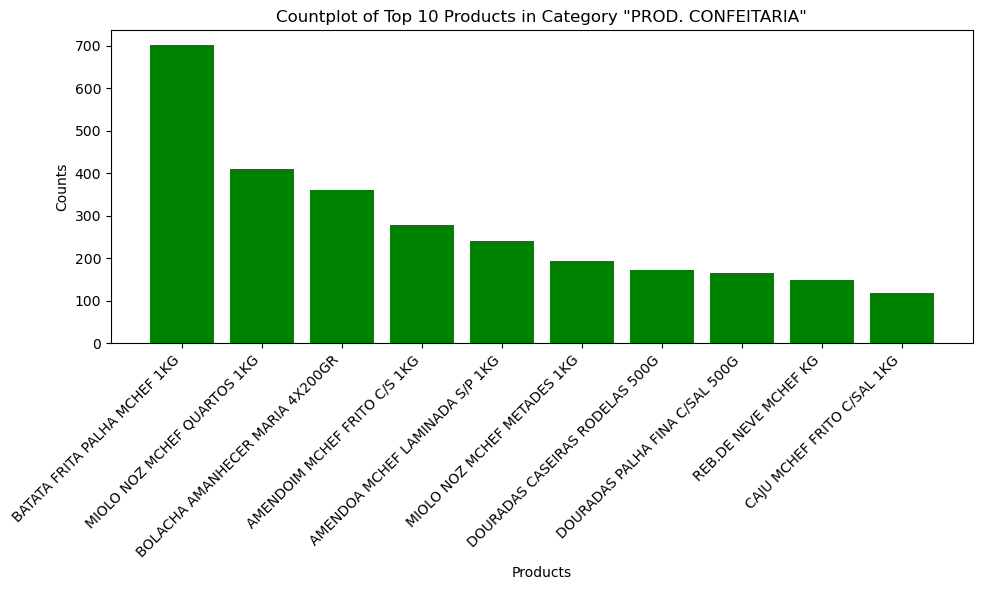

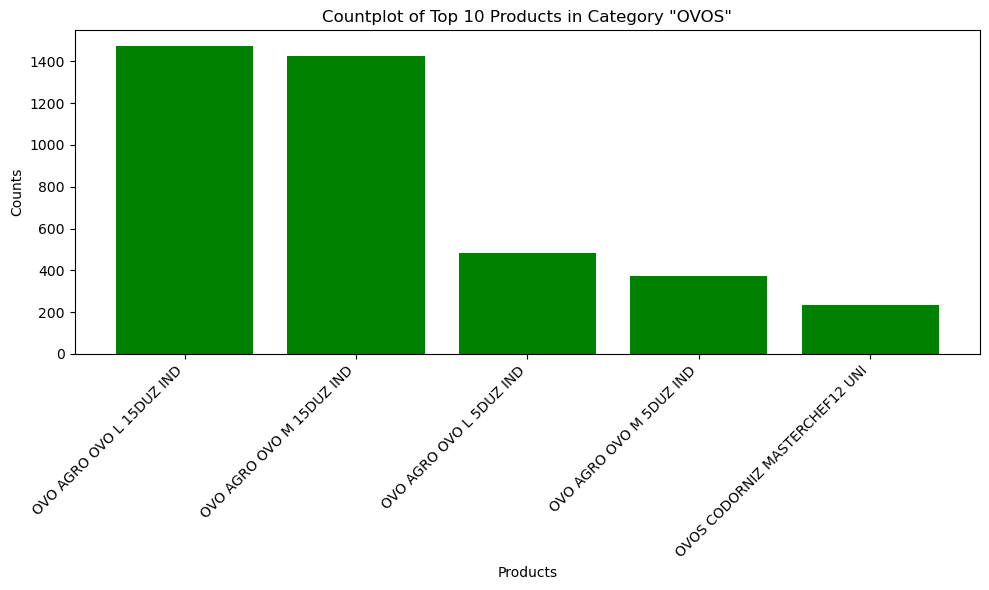

...

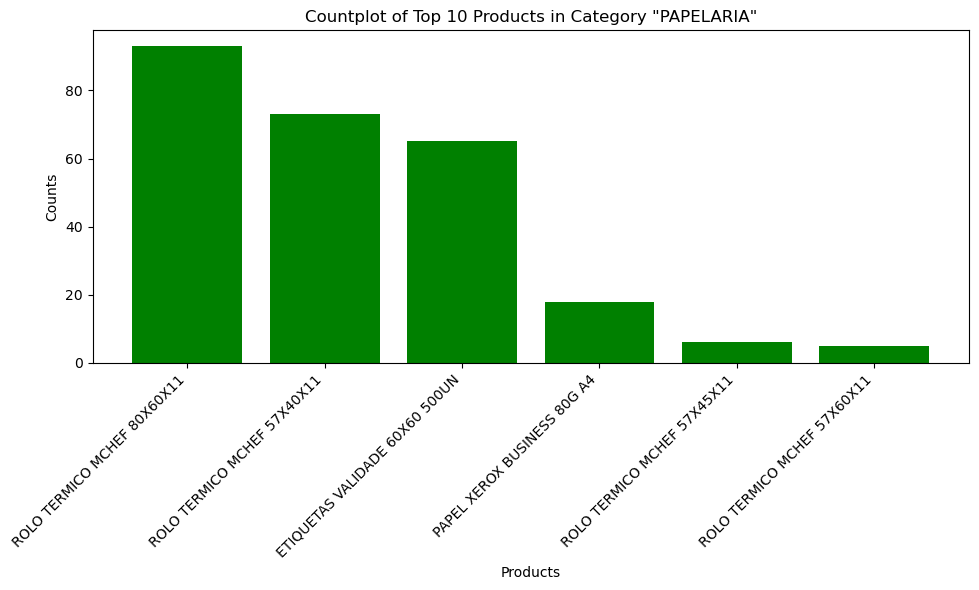

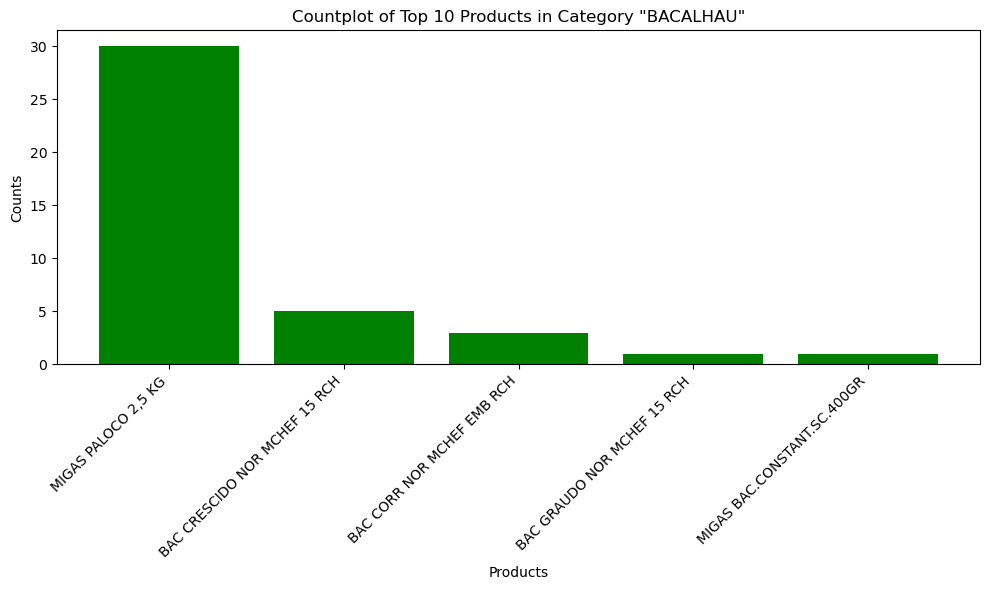

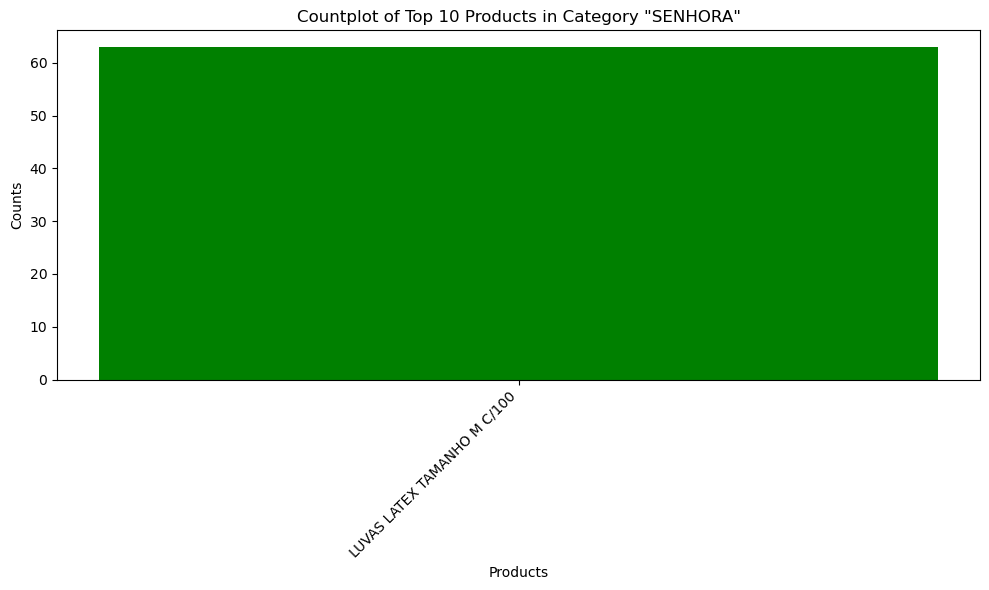

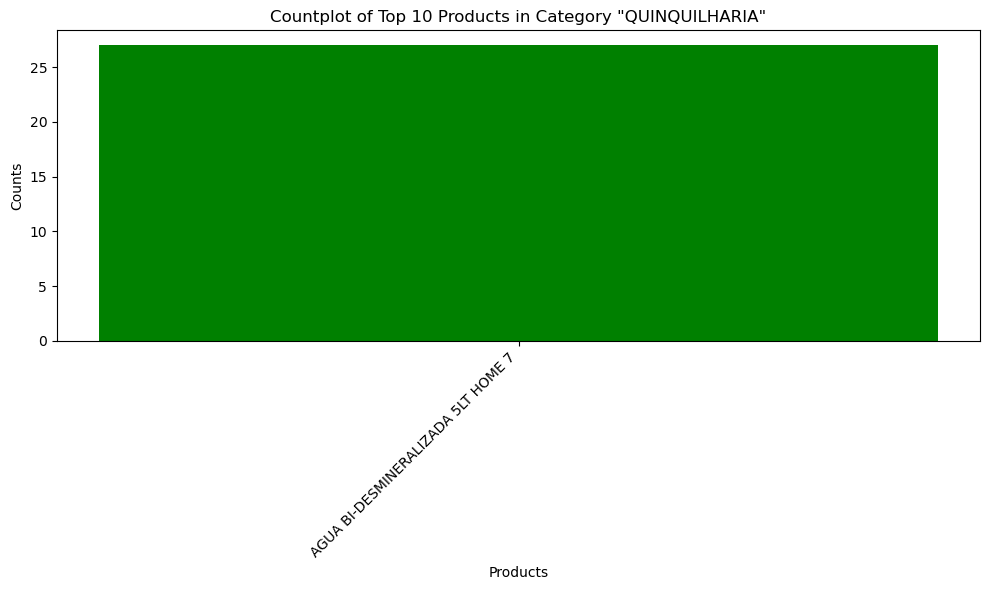

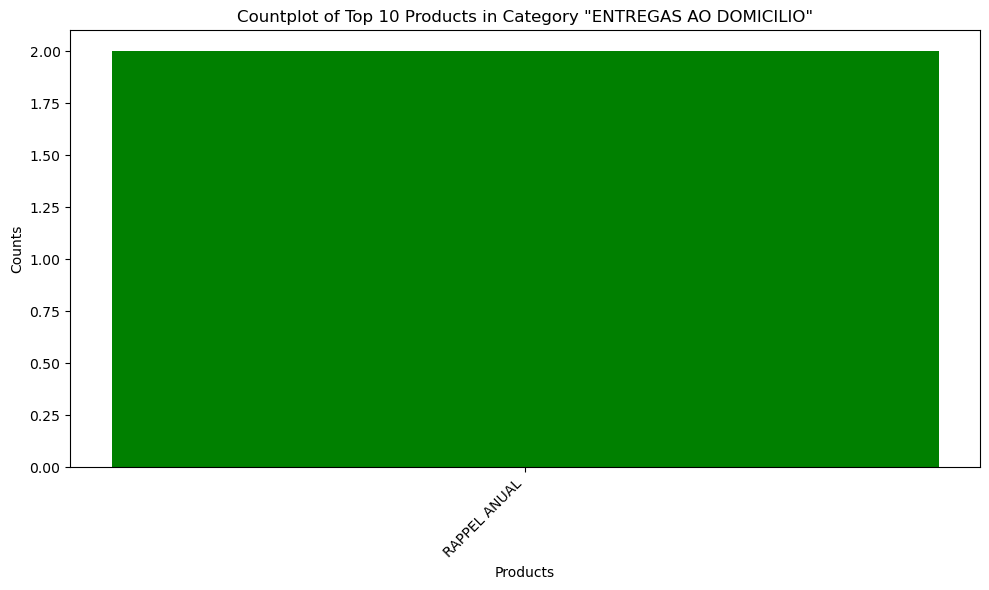

In [61]:
# Top Ten most popular products of each Product Category

# Get unique categories
unique_categories = client_transactions['ID Product Category'].unique()

# Iterate over categories
for category in unique_categories:
    # Filter data for current category
    category_data = client_transactions[client_transactions['ID Product Category'] == category]
    
    # Group by 'Product Description' and count occurrences
    products_counts = category_data.groupby('Product Description').size().reset_index(name='counts')
    
    # Get the top 10 most popular products
    top_10_products = products_counts.nlargest(10, 'counts')
    
    # Plot
    plt.figure(figsize=(10, 6))
    plt.bar(top_10_products['Product Description'], top_10_products['counts'], color='green')
    plt.xlabel('Products')
    plt.ylabel('Counts')
    plt.title(f'Countplot of Top 10 Products in Category "{category}"')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

#### 10 ID Client Type's that purchase the most and the least

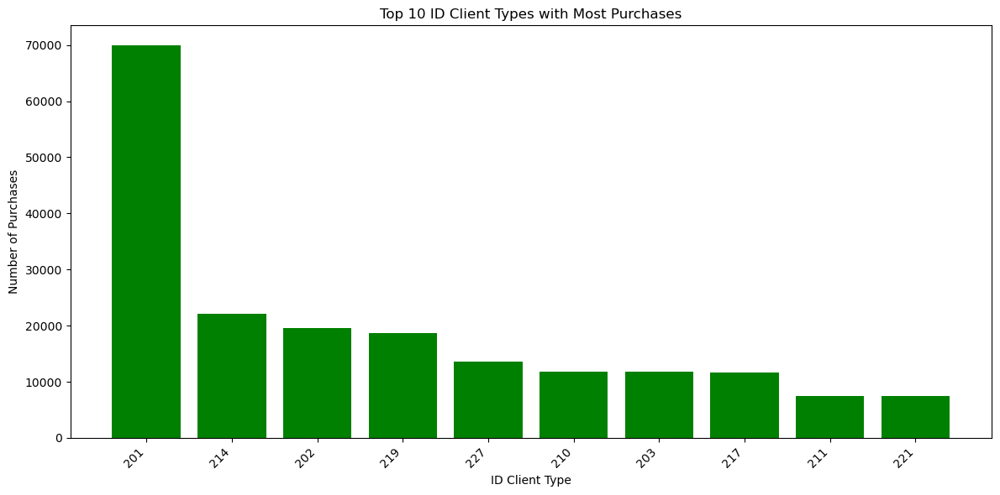

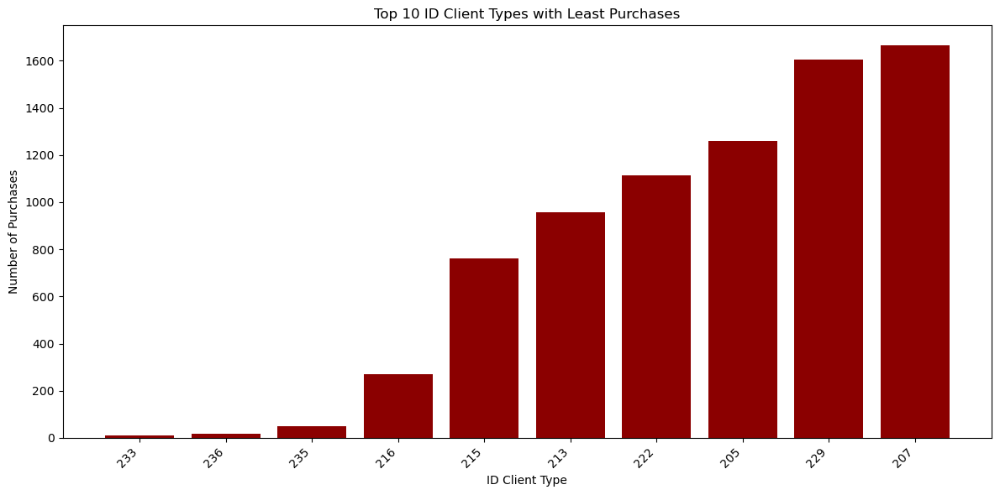

In [62]:
# Group by 'ID Client Type' and count transactions
client_type_purchases = client_transactions.groupby('ID Client Type')['ID Product'].count().reset_index()
client_type_purchases.columns = ['ID Client Type', 'Total Purchases']

# Get the top 10 ID Client Types with the most purchases
top_10_client_types = client_type_purchases.nlargest(10, 'Total Purchases')

# Get the bottom 10 ID Client Types with the least purchases
bottom_10_client_types = client_type_purchases.nsmallest(10, 'Total Purchases')

# Plot for top 10 ID Client Types with the most purchases
plt.figure(figsize=(12, 6))
plt.bar(top_10_client_types['ID Client Type'].astype(str), top_10_client_types['Total Purchases'], color='green')
plt.xlabel('ID Client Type')
plt.ylabel('Number of Purchases')
plt.title('Top 10 ID Client Types with Most Purchases')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Plot for bottom 10 ID Client Types with the least purchases
plt.figure(figsize=(12, 6))
plt.bar(bottom_10_client_types['ID Client Type'].astype(str), bottom_10_client_types['Total Purchases'], color='darkred')
plt.xlabel('ID Client Type')
plt.ylabel('Number of Purchases')
plt.title('Top 10 ID Client Types with Least Purchases')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### Transactions by Client Type Description

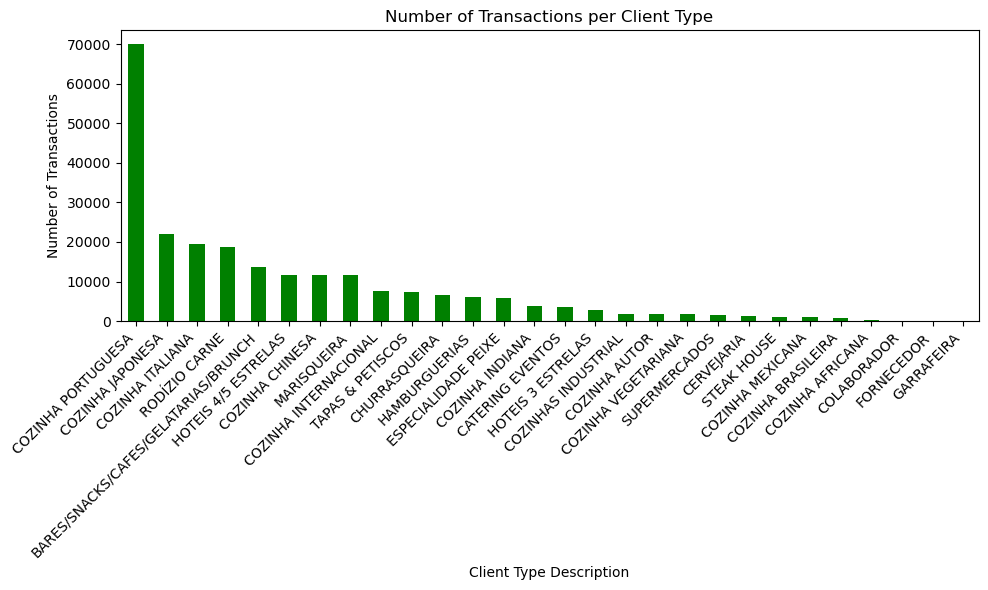

In [63]:
# Count transactions per client type
transaction_counts = client_transactions['Client Type Description'].value_counts()

# Plot the graph
plt.figure(figsize=(10, 6))
transaction_counts.plot(kind='bar', color='green')
plt.title('Number of Transactions per Client Type')
plt.xlabel('Client Type Description')
plt.ylabel('Number of Transactions')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

The client types that purchase more from Recheio are the ones related to Portuguese, Japanese and Italian cuisines, ‘RODIZIO DE CARNE’ and caffes, bars and brunch establishments.

#### 20 clients with the most and least purchases

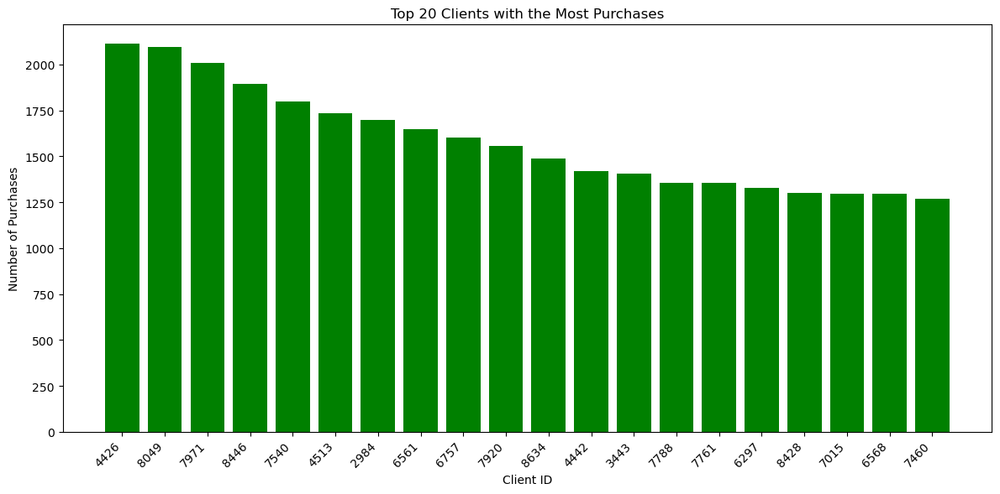

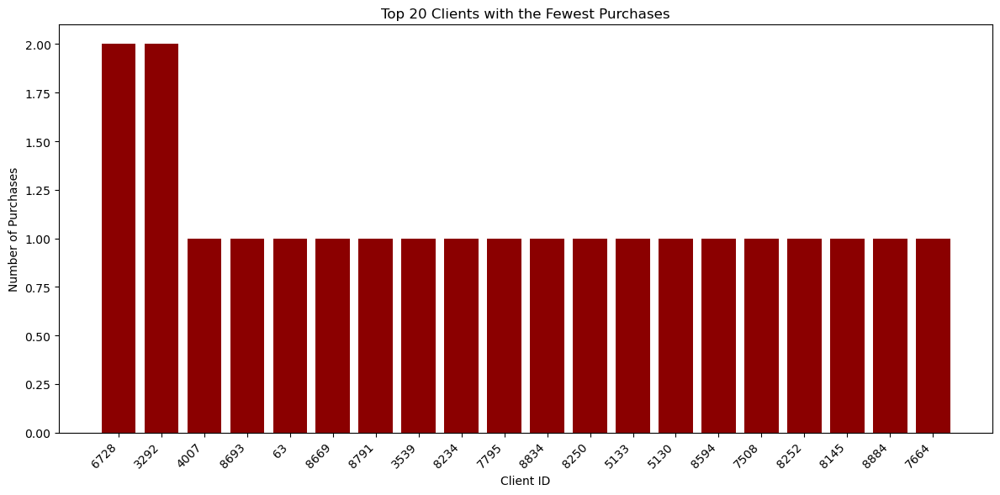

In [64]:
# Count occurrences of each Client ID
client_purchases = client_transactions['Client ID'].value_counts().reset_index()
client_purchases.columns = ['Client ID', 'Total Purchases']

# Get 10 clients with the most purchases (the 10 best clients)
top_20_clients = client_purchases.head(20)

# Get 10 clients with the fewest purchases (the 20 worst clients)
bottom_20_clients = client_purchases.tail(20)

# Plot for top 20 clients with the most purchases
plt.figure(figsize=(12, 6))
plt.bar(top_20_clients['Client ID'].astype(str), top_20_clients['Total Purchases'], color='green')
plt.xlabel('Client ID')
plt.ylabel('Number of Purchases')
plt.title('Top 20 Clients with the Most Purchases')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Plot for bottom 20 clients with the fewest purchases
plt.figure(figsize=(12, 6))
plt.bar(bottom_20_clients['Client ID'].astype(str), bottom_20_clients['Total Purchases'], color='darkred')
plt.xlabel('Client ID')
plt.ylabel('Number of Purchases')
plt.title('Top 20 Clients with the Fewest Purchases')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### Top 10 clients with the most transactions

Check each client transactions during this period of time:

In [65]:
# Group by 'Client ID' and 'Date' to count transactions
transactions_by_date = client_transactions.groupby(['Client ID', 'Date']).size().reset_index(name='Transactions')
transactions_by_date

,Client ID,Date,Transactions
0,63,2019-03-22,1
1,226,2019-03-06,4
2,226,2019-03-13,3
3,226,2019-03-20,7
4,226,2019-03-21,2
...,...,...,...
17601,8902,2019-05-28,10
17602,8902,2019-05-29,1
17603,8902,2019-05-30,8
17604,8908,2019-05-29,2


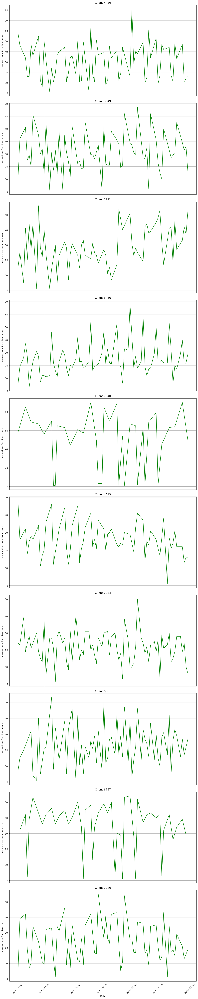

In [66]:
# Get top 10 clients with the most transactions
top_10_clients = transactions_by_date.groupby('Client ID')['Transactions'].sum().nlargest(10).index

# Filter transactions for top 10 clients
top_10_transactions = transactions_by_date[transactions_by_date['Client ID'].isin(top_10_clients)]

# Create a separate plot for each top 10 client
fig, axs = plt.subplots(len(top_10_clients), 1, figsize=(12, 6*len(top_10_clients)), sharex=True)

for idx, client_id in enumerate(top_10_clients):
    client_data = top_10_transactions[top_10_transactions['Client ID'] == client_id]
    ax = axs[idx]
    ax.plot(client_data['Date'], client_data['Transactions'],color='green')
    ax.set_ylabel(f'Transactions for Client {client_id}')
    ax.set_title(f'Client {client_id}')
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True)

plt.xlabel('Date')
plt.tight_layout()
plt.show()

#### Top 10 clients with the least transactions

Transactions for Client 63:
   Client ID       Date  Transactions
0         63 2019-03-22             1

Transactions for Client 3539:
      Client ID       Date  Transactions
1650       3539 2019-03-29             1

Transactions for Client 4007:
      Client ID       Date  Transactions
2129       4007 2019-03-27             1

Transactions for Client 5130:
      Client ID       Date  Transactions
4718       5130 2019-05-16             1

Transactions for Client 5133:
      Client ID       Date  Transactions
4719       5133 2019-05-17             1

Transactions for Client 7508:
      Client ID       Date  Transactions
8946       7508 2019-05-21             1

Transactions for Client 7664:
      Client ID       Date  Transactions
9293       7664 2019-04-11             1

Transactions for Client 7795:
      Client ID       Date  Transactions
9965       7795 2019-05-02             1

Transactions for Client 8145:
       Client ID       Date  Transactions
12197       8145 2019-04-18     

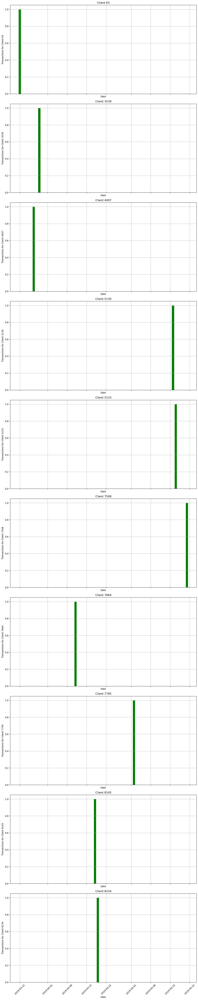

In [67]:
# Get 10 clients with the fewest transactions (the 10 worst clients)
least_10_clients = transactions_by_date.groupby('Client ID')['Transactions'].sum().nsmallest(10).index

# Filter transactions for the 10 worst clients
least_10_transactions = transactions_by_date[transactions_by_date['Client ID'].isin(least_10_clients)]

# Print the transactions for each of the 10 worst clients
for client_id in least_10_clients:
    client_data = least_10_transactions[least_10_transactions['Client ID'] == client_id]
    print(f"Transactions for Client {client_id}:\n{client_data}\n")

# Create a separate plot for each of the 10 worst clients
fig, axs = plt.subplots(len(least_10_clients), 1, figsize=(12, 6*len(least_10_clients)), sharex=True)

for idx, client_id in enumerate(least_10_clients):
    client_data = least_10_transactions[least_10_transactions['Client ID'] == client_id]
    ax = axs[idx]
    ax.bar(client_data['Date'], client_data['Transactions'],color='green')    #since they all just have 1 transaction, it has to be a scatter or bar plot
    ax.set_ylabel(f'Transactions for Client {client_id}')
    ax.set_title(f'Client {client_id}')
    ax.set_xlabel('Date')  # Set x-axis label on each subplot
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True)

plt.tight_layout()
plt.show()

#### Sales overtime by Product description (overall view)

In [68]:
# Group by 'Product Description' and 'Date' to count sales
sales_by_product = client_transactions.groupby(['Product Description', 'Date']).size().reset_index(name='Sales')

# Plot total sales for each product description over time
plt.figure(figsize=(12, 6))
for product in sales_by_product['Product Description'].unique():
    product_data = sales_by_product[sales_by_product['Product Description'] == product]
    plt.plot(product_data['Date'], product_data['Sales'], label=product)

plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Total Sales of Product Descriptions Over Time')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

C:\Users\emili\AppData\Local\Temp\ipykernel_36420\1807644757.py:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


#### Product categories associated with each Client Type Description

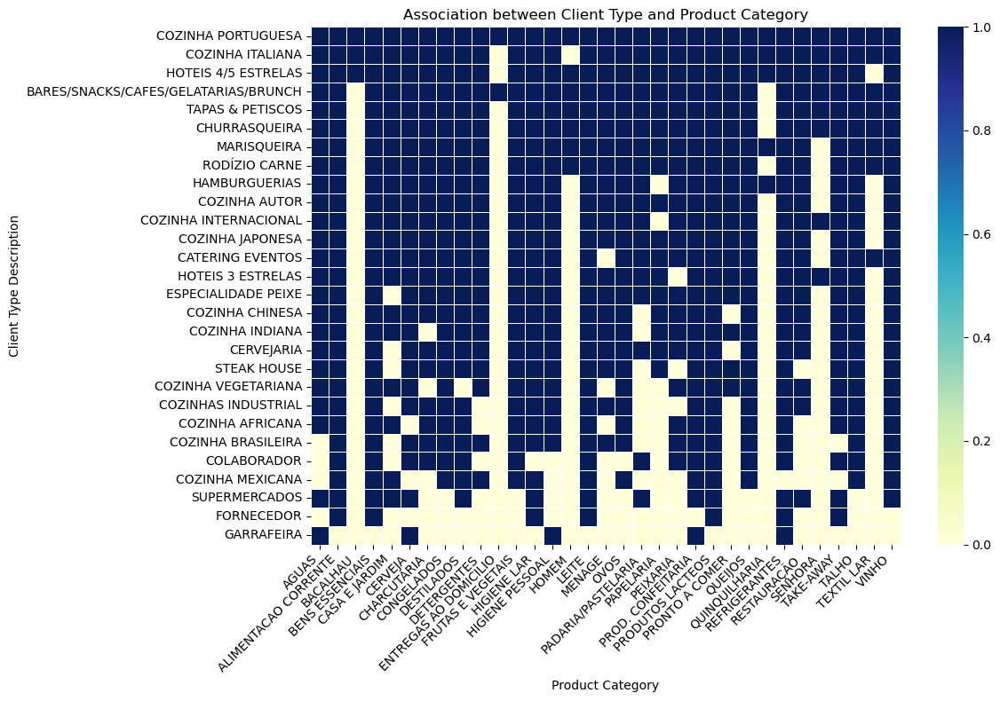

In [69]:
# Create a pivot table indicating whether a product category is associated with each client type
pivot_table = pd.pivot_table(client_transactions, 
                             index='Client Type Description', 
                             columns='ID Product Category', 
                             values='ID Product', 
                             aggfunc=lambda x: 1 if len(x) > 0 else 0, 
                             fill_value=0)

# Sort the rows (client types) based on the sum of values across each row
pivot_table = pivot_table.loc[pivot_table.sum(axis=1).sort_values(ascending=False).index]

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='YlGnBu', annot=False, fmt='g', linewidths=0.5)
plt.title('Association between Client Type and Product Category')
plt.xlabel('Product Category')
plt.ylabel('Client Type Description')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

When crossing ‘Client Type’ and ‘Product Category’ through the following heat map, there are some understandings that can be taken, having in mind that the darker the colour, the more association between the 2 variables there is. 
- ‘COZINHA PORTUGESA’ is the only client type that purchases products from all categories, contrarily to ‘GARRAFEIRA’;
- The product category that sells to the smallest number of client types is ‘ENTREGAS AO DOMICILIO’ and the client type that buys the less amount of product categories is ‘GARRAFEIRA’;
- Each client type usually just buys products from categories which they are commonly associated with. This means that, and can be seen below, for example, ‘HAMBURGUERIAS’, ‘CHURRASQUEIRA’ or ‘RODIZIO CARNE’ don’t buy ‘BACALHAU’.


# Data Pre-Processing

Since the dataframes were already merged on previous steps, now we can focus on other details: outliers, missing values, duplicates and explore some other possible variables, all related to this merged datset client_transactions.

In [70]:
client_transactions

,ID Product,Product Description,ID Product Category,Date,Client ID,ZIP Code,ID Client Type,Client Type Description,Day of Week,Weekday Name
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,2820,219,RODÍZIO CARNE,4,Friday
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,2820,219,RODÍZIO CARNE,2,Wednesday
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,2820,219,RODÍZIO CARNE,4,Friday
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,2820,219,RODÍZIO CARNE,4,Friday
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,2820,219,RODÍZIO CARNE,2,Wednesday
...,...,...,...,...,...,...,...,...,...,...
234140,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,1250,201,COZINHA PORTUGUESA,2,Wednesday
234141,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,1250,201,COZINHA PORTUGUESA,2,Wednesday
234142,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,1400,201,COZINHA PORTUGUESA,1,Tuesday
234143,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-27,7364,1400,201,COZINHA PORTUGUESA,2,Wednesday


### Checking missing values

In [71]:
client_transactions.isnull().sum()

ID Product                 0
Product Description        0
ID Product Category        0
Date                       0
Client ID                  0
ZIP Code                   0
ID Client Type             0
Client Type Description    0
Day of Week                0
Weekday Name               0
dtype: int64

There are no missing values on the dataset.

### Look for duplicates

In [72]:
# Check duplicate values
client_transactions.duplicated().sum()

0

In [73]:
# Check for duplicates in the DataFrame
duplicates = client_transactions.duplicated()

# Count the total number of duplicates
total_duplicates = duplicates.sum()

if total_duplicates > 0:
    print("Found", total_duplicates, "duplicate transactions.")
else:
    print("No duplicate transactions found, each row is unique.")

No duplicate transactions found, each row is unique.


### Number of products by category

In [74]:
product_categories = client_transactions.groupby('ID Product Category')['ID Product'].count()
product_categories

ID Product Category
AGUAS                     4506
ALIMENTACAO CORRENTE     48468
BACALHAU                    40
BENS ESSENCIAIS          26159
CASA E JARDIM              152
CERVEJA                   1830
CHARCUTARIA               6107
CONGELADOS               18221
DESTILADOS                6082
DETERGENTES               2324
ENTREGAS AO DOMICILIO        2
FRUTAS E VEGETAIS        42131
HIGIENE LAR               6480
HIGIENE PESSOAL           2107
HOMEM                       15
LEITE                     5193
MENAGE                     266
OVOS                      3990
PADARIA/PASTELARIA         186
PAPELARIA                  260
PEIXARIA                  6053
PROD. CONFEITARIA         4624
PRODUTOS LACTEOS         10663
PRONTO A COMER             669
QUEIJOS                   7285
QUINQUILHARIA               27
REFRIGERANTES             8765
RESTAURAÇÃO               2671
SENHORA                     63
TAKE-AWAY                 4416
TALHO                     5168
TEXTIL LAR         

### Number of products by ZIP code

In [75]:
pd.set_option('display.max_rows', 60)

In [76]:
sales_by_zipcode = client_transactions.groupby('ZIP Code')['ID Product'].count()
sales_by_zipcode_sorted = sales_by_zipcode.sort_values(ascending=False)

print(sales_by_zipcode_sorted)

ZIP Code
1100    19817
1200    15599
1050    13722
1500    11739
1000    11272
        ...  
9500        2
3300        2
2730        1
2739        1
6000        1
Name: ID Product, Length: 116, dtype: int64


### Client frequency

In [77]:
purchase_frequency = client_transactions.groupby('Client ID')['Date'].transform('count')

print(purchase_frequency.head(30))

0     727
1     727
2     727
3     727
4     727
5     727
6     727
7     727
8     727
9     727
10    727
11    727
12    727
13    727
14    727
15    727
16    727
17    727
18    727
19    727
20    727
21    727
22    727
23    727
24    727
25    727
26    727
27    727
28    727
29    727
Name: Date, dtype: int64


In [78]:
client_transactions['ID Client Type'].unique()

array([219, 214, 203, 211, 210, 201, 220, 217, 202, 206, 204, 208, 209,
       221, 226, 227, 222, 228, 215, 207, 216, 224, 205, 229, 213, 235,
       233, 236], dtype=object)

### Product Description frequency

In [79]:
product_frequency = client_transactions['Product Description'].value_counts()
print(product_frequency)

Product Description
ACUCAR MCHEF BRANCO PAPEL KG           3379
OLEO ALIMENTAR MCHEF 10 LT             2796
LEITE MCHEF UHT M/GORDO LT             2442
ALFACE FRISADA PLT                     1869
DET LOICA MCHEF 10LT                   1719
                                       ... 
ESPUMANTE TERRAS DEMO BRT ROSÉ 75CL       1
REF AMANHECER S/G LARANJA PET 1,5L        1
CANTARIL 800/ KG.(CX 3 KG.)               1
FANECA CX 5 KG F03                        1
V. DOURO SAGRADO VT TTO 75CL              1
Name: count, Length: 2497, dtype: int64


### ID Product Category frequency

In [80]:
product_category_frequency = client_transactions['ID Product Category'].value_counts()
print(product_category_frequency)

ID Product Category
ALIMENTACAO CORRENTE     48468
FRUTAS E VEGETAIS        42131
BENS ESSENCIAIS          26159
CONGELADOS               18221
PRODUTOS LACTEOS         10663
VINHO                     9187
REFRIGERANTES             8765
QUEIJOS                   7285
HIGIENE LAR               6480
CHARCUTARIA               6107
DESTILADOS                6082
PEIXARIA                  6053
LEITE                     5193
TALHO                     5168
PROD. CONFEITARIA         4624
AGUAS                     4506
TAKE-AWAY                 4416
OVOS                      3990
RESTAURAÇÃO               2671
DETERGENTES               2324
HIGIENE PESSOAL           2107
CERVEJA                   1830
PRONTO A COMER             669
MENAGE                     266
PAPELARIA                  260
PADARIA/PASTELARIA         186
CASA E JARDIM              152
SENHORA                     63
BACALHAU                    40
TEXTIL LAR                  35
QUINQUILHARIA               27
HOMEM              

### Look for Outliers 

To identify possible outliers, the IQR method was utilized.

In [81]:
transactions_per_client = client_transactions.groupby('Client ID').size()

stats = transactions_per_client.describe()

IQR = stats['75%'] - stats['25%']
upper_bound = stats['75%'] + 1.5 * IQR
lower_bound = stats['25%'] - 1.5 * IQR

# Identify outliers
outliers = transactions_per_client[(transactions_per_client > upper_bound) | (transactions_per_client < lower_bound)]

print(outliers)

Client ID
1013     739
1394    1040
2984    1697
3337     769
3356    1059
        ... 
8447    1059
8458     943
8500     780
8581     867
8634    1488
Length: 69, dtype: int64


In [82]:
client_transactions['Is_Outlier'] = client_transactions['Client ID'].isin(outliers.index)

print(client_transactions['Is_Outlier'].value_counts())

outlier_customers = client_transactions[client_transactions['Is_Outlier'] == True]
regular_customers = client_transactions[client_transactions['Is_Outlier'] == False]

num_outlier_customers = outlier_customers['Client ID'].nunique()
num_regular_customers = regular_customers['Client ID'].nunique()

print("Número de clientes outliers:", num_outlier_customers)
print("Número de clientes regulares:", num_regular_customers)

Is_Outlier
False    158041
True      76104
Name: count, dtype: int64
Número de clientes outliers: 69
Número de clientes regulares: 861


There are 69 customers identified as outliers based on the number of transactions they performed. These customers carried out a total of 76,104 transactions.
The rest of the customers, which are 861 in total, are considered regular customers and carried out 158,041 transactions.

In [83]:
outlier_transactions = client_transactions[client_transactions['Client ID'].isin(outliers.index)]

most_bought_by_outliers = outlier_transactions['Product Description'].value_counts().head()

print("Produtos mais comprados pelos outliers:")
print(most_bought_by_outliers)

Produtos mais comprados pelos outliers:
Product Description
ALFACE FRISADA PLT              934
OLEO ALIMENTAR MCHEF 10 LT      739
ACUCAR MCHEF BRANCO PAPEL KG    719
COENTROS PLT                    695
LARANJA CAL7 (67/76) RCH        672
Name: count, dtype: int64


In [84]:
# Dataset with the new variable 
client_transactions

,ID Product,Product Description,ID Product Category,Date,Client ID,ZIP Code,ID Client Type,Client Type Description,Day of Week,Weekday Name,Is_Outlier
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,2820,219,RODÍZIO CARNE,4,Friday,False
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,2820,219,RODÍZIO CARNE,2,Wednesday,False
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,2820,219,RODÍZIO CARNE,4,Friday,False
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,2820,219,RODÍZIO CARNE,4,Friday,False
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,2820,219,RODÍZIO CARNE,2,Wednesday,False
...,...,...,...,...,...,...,...,...,...,...,...
234140,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,1250,201,COZINHA PORTUGUESA,2,Wednesday,False
234141,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,1250,201,COZINHA PORTUGUESA,2,Wednesday,False
234142,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,1400,201,COZINHA PORTUGUESA,1,Tuesday,False
234143,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-27,7364,1400,201,COZINHA PORTUGUESA,2,Wednesday,False


After analysing the presence of outliers on our dataste and in the context of our problem, we decided to keep them, since the Recommendation Systems measures the existence and not the quantity of something (outliers are based on the quantity of something).

In [85]:
# Drop the variable that identified which rows were outliers 
client_transactions.drop('Is_Outlier', axis=1, inplace=True)

## Feature Engeneering

### Replace "ZIP Code" with new variable "Location"

Identify the correspondent "Location" for each "ZIP Code"

In [86]:
df0 = client_transactions.copy()

In [87]:
postal_codes_mapping = {
    # Lisbon
    1350: "Lisboa", 1250: "Lisboa", 1150: "Lisboa", 1099: "Lisboa",
    1200: "Lisboa", 1070: "Lisboa", 1000: "Lisboa", 1749: "Lisboa",
    1700: "Lisboa", 1050: "Lisboa", 1400: "Lisboa", 1800: "Lisboa",
    1170: "Lisboa", 1300: "Lisboa", 1500: "Lisboa", 1600: "Lisboa",
    1100: "Lisboa", 1900: "Lisboa", 1069: "Lisboa", 1149: "Lisboa",
    1750: "Lisboa", 2050: "Lisboa", 1998: "Lisboa", 2630: "Lisboa",
    2580: "Lisboa", 1449: "Lisboa", 1950: "Lisboa", 2590: "Lisboa",
    2625: "Lisboa", 2600: "Lisboa", 2675: "Lisboa", 2620: "Lisboa",
    # Cascais
    2645: "Cascais", 2765: "Cascais", 2750: "Cascais",
    2745: "Cascais", 2785: "Cascais", 2755: "Cascais",
    # Oeiras
    1495: "Oeiras", 2780: "Oeiras", 2795: "Oeiras", 2770: "Oeiras",
    2740: "Oeiras", 2790: "Oeiras", 2730: "Oeiras", 2774: "Oeiras",
    # Sintra
    2705: "Sintra", 2710: "Sintra", 2605: "Sintra",
    2635: "Sintra", 2739: "Sintra", 2735: "Sintra", 2715: "Sintra",
    # Mafra
    2640: "Mafra", 2665: "Mafra", 2655: "Mafra",
    # Amadora
    2610: "Amadora", 2650: "Amadora", 2700: "Amadora",
    2720: "Amadora", 2724: "Amadora",
    # Loures
    1990: "Loures", 2660: "Loures", 2670: "Loures", 1885: "Loures",
    2695: "Loures", 2680: "Loures", 2685: "Loures", 2674: "Loures",
    # Montijo
    2870: "Montijo",
    # Setúbal
    2900: "Setúbal", 2810: "Setúbal", 2890: "Setúbal", 2950: "Setúbal",
    7520: "Setúbal", 2800: "Setúbal", 2820: "Setúbal", 2910: "Setúbal",
    2805: "Setúbal", 7500: "Setúbal", 2914: "Setúbal", 2975: "Setúbal",
    7565: "Setúbal", 2815: "Setúbal", 7540: "Setúbal", 2845: "Setúbal",
    2901: "Setúbal", 2860: "Setúbal", 2955: "Setúbal", 2865: "Setúbal",
    # Açores
    9500: "Açores",
    # Beja
    7860: "Beja",
   # Santarém
    2350: "Santarém", 2100: "Santarém", 2040: "Santarém", 2135: "Santarém",
    # Coimbra
    3200: "Coimbra", 3300: "Coimbra",
    # Braga
    4770: "Braga",
    # Castelo Branco
    6000: "Castelo Branco",
    # Faro
    8700: "Faro", 8365: "Faro",
    # Leiria
    2460: "Leiria", 2420: "Leiria"
}
    
def map_zip_code_to_region(zip_code):
    return postal_codes_mapping.get(zip_code, 'Other')

client_transactions['Location'] = client_transactions['ZIP Code'].apply(map_zip_code_to_region)

print(client_transactions.head())

  ID Product           Product Description ID Product Category       Date  \
0     110110  ACUCAR MCHEF BRANCO PAPEL KG     BENS ESSENCIAIS 2019-03-01   
1     110110  ACUCAR MCHEF BRANCO PAPEL KG     BENS ESSENCIAIS 2019-03-06   
2     110110  ACUCAR MCHEF BRANCO PAPEL KG     BENS ESSENCIAIS 2019-03-08   
3     110110  ACUCAR MCHEF BRANCO PAPEL KG     BENS ESSENCIAIS 2019-03-15   
4     110110  ACUCAR MCHEF BRANCO PAPEL KG     BENS ESSENCIAIS 2019-03-20   

  Client ID ZIP Code ID Client Type Client Type Description  Day of Week  \
0      4917     2820            219           RODÍZIO CARNE            4   
1      4917     2820            219           RODÍZIO CARNE            2   
2      4917     2820            219           RODÍZIO CARNE            4   
3      4917     2820            219           RODÍZIO CARNE            4   
4      4917     2820            219           RODÍZIO CARNE            2   

  Weekday Name Location  
0       Friday  Setúbal  
1    Wednesday  Setúbal  
2 

In [88]:
# Just use the "Location" variable
client_transactions.drop('ZIP Code', axis=1, inplace=True)

In [89]:
client_transactions

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Weekday Name,Location
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,219,RODÍZIO CARNE,4,Friday,Setúbal
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,219,RODÍZIO CARNE,2,Wednesday,Setúbal
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,219,RODÍZIO CARNE,4,Friday,Setúbal
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,219,RODÍZIO CARNE,4,Friday,Setúbal
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,219,RODÍZIO CARNE,2,Wednesday,Setúbal
...,...,...,...,...,...,...,...,...,...,...
234140,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,201,COZINHA PORTUGUESA,2,Wednesday,Lisboa
234141,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,201,COZINHA PORTUGUESA,2,Wednesday,Lisboa
234142,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,201,COZINHA PORTUGUESA,1,Tuesday,Lisboa
234143,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-27,7364,201,COZINHA PORTUGUESA,2,Wednesday,Lisboa


### Remove non-Lisbon locations

Remove the transactions related to the locations that are neither in the district of Lisbon, nor in Área Metropolitana de Lisboa. There are not many transactions with this locations and the database given is from a distribution center from Lisbon, so they are considered mistakes.

In [90]:
# Districts to remove
districts_to_remove = ['Açores', 'Beja', 'Braga', 'Coimbra', 'Faro', 'Leiria', 'Castelo Branco', 'Santarém']

# Filter out rows where the Location is one of the specified districts
client_transactions = client_transactions[~client_transactions['Location'].isin(districts_to_remove)]
client_transactions

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Weekday Name,Location
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,219,RODÍZIO CARNE,4,Friday,Setúbal
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,219,RODÍZIO CARNE,2,Wednesday,Setúbal
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,219,RODÍZIO CARNE,4,Friday,Setúbal
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,219,RODÍZIO CARNE,4,Friday,Setúbal
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,219,RODÍZIO CARNE,2,Wednesday,Setúbal
...,...,...,...,...,...,...,...,...,...,...
234140,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,201,COZINHA PORTUGUESA,2,Wednesday,Lisboa
234141,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,201,COZINHA PORTUGUESA,2,Wednesday,Lisboa
234142,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,201,COZINHA PORTUGUESA,1,Tuesday,Lisboa
234143,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-27,7364,201,COZINHA PORTUGUESA,2,Wednesday,Lisboa


### Remove "Weekday Name" from the dataset 

This variable is not usefull anymore, was used in the context of data exploration.

In [91]:
# client_transactions.drop('Day of Week', axis=1, inplace=True)
client_transactions.drop('Weekday Name', axis=1, inplace=True)

C:\Users\emili\AppData\Local\Temp\ipykernel_36420\1409612632.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  client_transactions.drop('Weekday Name', axis=1, inplace=True)


### Remove transactions from customer types: 'Colaborador' and 'Fornecedor'

Colaborators or Suppliers can also buy from Recheio, but it is not relevant in our case.

In [92]:
# Filter out rows where the Client Type is "COLABORADOR" or "FORNECEDOR"
client_transactions = client_transactions[(client_transactions['Client Type Description'] != 'COLABORADOR') & (client_transactions['Client Type Description'] != 'FORNECEDOR')]

# Display the filtered DataFrame
client_transactions

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Location
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,219,RODÍZIO CARNE,4,Setúbal
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,219,RODÍZIO CARNE,2,Setúbal
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,219,RODÍZIO CARNE,4,Setúbal
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,219,RODÍZIO CARNE,4,Setúbal
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,219,RODÍZIO CARNE,2,Setúbal
...,...,...,...,...,...,...,...,...,...
234139,748253,V VERDE VILA NOVA SAUVIGNON BLANC 75CL,VINHO,2019-04-29,8844,201,COZINHA PORTUGUESA,0,Lisboa
234140,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,201,COZINHA PORTUGUESA,2,Lisboa
234141,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,201,COZINHA PORTUGUESA,2,Lisboa
234142,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,201,COZINHA PORTUGUESA,1,Lisboa


### Season feature

Creation of season variable, return '1' if the transaction was before 2019-04-14 (colder months) and '2' if it was after. Can be helpful due to seasonality, even though we just have data from March until May.

In [93]:
client_transactions.loc[client_transactions['Date']<='2019-04-14','Season']=1

C:\Users\emili\AppData\Local\Temp\ipykernel_36420\3902450781.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  client_transactions.loc[client_transactions['Date']<='2019-04-14','Season']=1


In [94]:
client_transactions=client_transactions.fillna(2)

In [95]:
client_transactions

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Location,Season
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,219,RODÍZIO CARNE,4,Setúbal,1.0
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,219,RODÍZIO CARNE,2,Setúbal,1.0
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,219,RODÍZIO CARNE,4,Setúbal,1.0
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,219,RODÍZIO CARNE,4,Setúbal,1.0
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,219,RODÍZIO CARNE,2,Setúbal,1.0
...,...,...,...,...,...,...,...,...,...,...
234139,748253,V VERDE VILA NOVA SAUVIGNON BLANC 75CL,VINHO,2019-04-29,8844,201,COZINHA PORTUGUESA,0,Lisboa,2.0
234140,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0
234141,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0
234142,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,201,COZINHA PORTUGUESA,1,Lisboa,1.0


In [96]:
client_transactions[client_transactions['Season']==2]

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Location,Season
8,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-04-19,4917,219,RODÍZIO CARNE,4,Setúbal,2.0
9,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-04-24,4917,219,RODÍZIO CARNE,2,Setúbal,2.0
10,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-05-01,4917,219,RODÍZIO CARNE,2,Setúbal,2.0
11,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-05-03,4917,219,RODÍZIO CARNE,4,Setúbal,2.0
12,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-05-10,4917,219,RODÍZIO CARNE,4,Setúbal,2.0
...,...,...,...,...,...,...,...,...,...,...
234134,744444,V.P.SETÚBAL JP TTO 25CL,VINHO,2019-05-03,8693,204,COZINHA INDIANA,4,Loures,2.0
234136,748247,V VERDE VILA NOVA LOUREIRO 75CL,VINHO,2019-05-17,8885,227,BARES/SNACKS/CAFES/GELATARIAS/BRUNCH,4,Lisboa,2.0
234137,748247,V VERDE VILA NOVA LOUREIRO 75CL,VINHO,2019-05-20,8885,227,BARES/SNACKS/CAFES/GELATARIAS/BRUNCH,0,Lisboa,2.0
234138,748252,V VERDE VILA NOVA BCO 75CL,VINHO,2019-04-29,8844,201,COZINHA PORTUGUESA,0,Lisboa,2.0


### "Weekday features"

Creation of variable that returns '1' if the transaction was made between Monday and Wednesday, and '2' if it was between Thursday and Saturday, usually used in business context.

In [97]:
client_transactions.loc[client_transactions['Day of Week']<=2,'Week Value']=1

In [98]:
client_transactions = client_transactions.fillna(2)

In [99]:
client_transactions

,ID Product,Product Description,ID Product Category,Date,Client ID,ID Client Type,Client Type Description,Day of Week,Location,Season,Week Value
0,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-01,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
1,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-06,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0
2,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-08,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
3,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-15,4917,219,RODÍZIO CARNE,4,Setúbal,1.0,2.0
4,110110,ACUCAR MCHEF BRANCO PAPEL KG,BENS ESSENCIAIS,2019-03-20,4917,219,RODÍZIO CARNE,2,Setúbal,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
234139,748253,V VERDE VILA NOVA SAUVIGNON BLANC 75CL,VINHO,2019-04-29,8844,201,COZINHA PORTUGUESA,0,Lisboa,2.0,1.0
234140,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-06,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0
234141,748254,V VERDE VILA NOVA CHARDONNAY 75CL,VINHO,2019-03-27,6464,201,COZINHA PORTUGUESA,2,Lisboa,1.0,1.0
234142,748341,V.TERRAS ESTREMOZ BCO 75CL,VINHO,2019-03-26,7364,201,COZINHA PORTUGUESA,1,Lisboa,1.0,1.0


# Continue on Group_F_3rdCase_Code2_Modeling notebook for Modeling phase
Modeling - Recommender Systems:
- MBA
- Page Rank
- Clustering with K-Means (not recommender system, just to enrich them)
- Collaborative Filtering (Item-Based Cosine Similarity, Singular Value Decomposition and Simple Interaction Model)

Save the dataframe in a CSV file, to be open in the second notebook 

In [100]:
# Save DataFrame to CSV file
client_transactions.to_csv('client_transactions.csv', index=False)